In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, img_to_array
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import TargetEncoder
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from collections import Counter
from sklearn.cluster import KMeans
from tensorflow.keras.applications import MobileNetV2, ResNet50


2024-12-06 18:24:30.256916: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-06 18:24:30.325718: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-06 18:24:30.345557: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-06 18:24:30.478050: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-06 18:24:31.751749: W tensorflow/compiler/tf2

In [2]:
def getPredictionsTrain(model, dataset):
    y_pred = []  # store predicted labels
    y_true = []  # store true labels
    
    # Reset generator to start from the beginning
    dataset.reset()
  
    # Iterate over the dataset
    for _ in range(dataset.num_batches):
        image_batch, label_batch = next(dataset)
        # append true labels
        y_true.append(label_batch)
        # compute predictions
        preds = model.predict(image_batch, verbose=0)
        # append predicted labels
        y_pred.append(np.argmax(preds, axis=-1))

    # convert the true and predicted labels into tensors
    y_true = tf.concat([tf.convert_to_tensor(item) for item in y_true], axis=0)
    y_pred_classes = tf.concat([tf.convert_to_tensor(item) for item in y_pred], axis=0)
    class_labels = list(dataset.class_indices.keys())

    return y_true, y_pred_classes, class_labels

In [3]:
train_datagen = ImageDataGenerator(rescale=1./255)

val_datagen = ImageDataGenerator(rescale=1./255)

test_datagen = ImageDataGenerator(rescale=1./255)

In [4]:
batch_size = 64 
img_size = (224, 224)
def countImagesInClasses(dataset):
    class_counts = Counter()
    for _ in range(dataset.num_batches):
        _, labels = next(dataset)
        class_indices = np.argmax(labels, axis=1)
        class_counts.update(class_indices)
    return class_counts

print("Train_ds:")
train_ds = train_datagen.flow_from_directory(
    directory='bird_dataset/train',
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=img_size,
    shuffle=True)

class_names = {v: k for k, v in train_ds.class_indices.items()}

for index, count in countImagesInClasses(train_ds).items():
    print(f"  Trieda '{class_names[index]}': {count} obrázkov")
print("===================================")

print("Validation_ds:")
validation_ds = val_datagen.flow_from_directory(
    directory='bird_dataset/validation',
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=img_size,
    shuffle=False)

class_names = {v: k for k, v in validation_ds.class_indices.items()}

for index, count in countImagesInClasses(validation_ds).items():
    print(f"  Trieda '{class_names[index]}': {count} obrázkov")
print("===================================")

print("Test_ds:")
test_ds = test_datagen.flow_from_directory(
    directory='bird_dataset/test',
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=img_size,
    shuffle=False)
class_names = {v: k for k, v in test_ds.class_indices.items()}
for index, count in countImagesInClasses(test_ds).items():
    print(f"  Trieda '{class_names[index]}': {count} obrázkov")
print("===================================")



Train_ds:
Found 6400 images belonging to 200 classes.
  Trieda '057.Rose_breasted_Grosbeak': 32 obrázkov
  Trieda '133.White_throated_Sparrow': 32 obrázkov
  Trieda '148.Green_tailed_Towhee': 32 obrázkov
  Trieda '149.Brown_Thrasher': 32 obrázkov
  Trieda '047.American_Goldfinch': 32 obrázkov
  Trieda '155.Warbling_Vireo': 32 obrázkov
  Trieda '039.Least_Flycatcher': 32 obrázkov
  Trieda '164.Cerulean_Warbler': 32 obrázkov
  Trieda '006.Least_Auklet': 32 obrázkov
  Trieda '090.Red_breasted_Merganser': 32 obrázkov
  Trieda '017.Cardinal': 32 obrázkov
  Trieda '078.Gray_Kingbird': 32 obrázkov
  Trieda '181.Worm_eating_Warbler': 32 obrázkov
  Trieda '132.White_crowned_Sparrow': 32 obrázkov
  Trieda '153.Philadelphia_Vireo': 32 obrázkov
  Trieda '028.Brown_Creeper': 32 obrázkov
  Trieda '189.Red_bellied_Woodpecker': 32 obrázkov
  Trieda '097.Orchard_Oriole': 32 obrázkov
  Trieda '125.Lincoln_Sparrow': 32 obrázkov
  Trieda '015.Lazuli_Bunting': 32 obrázkov
  Trieda '095.Baltimore_Oriole': 3

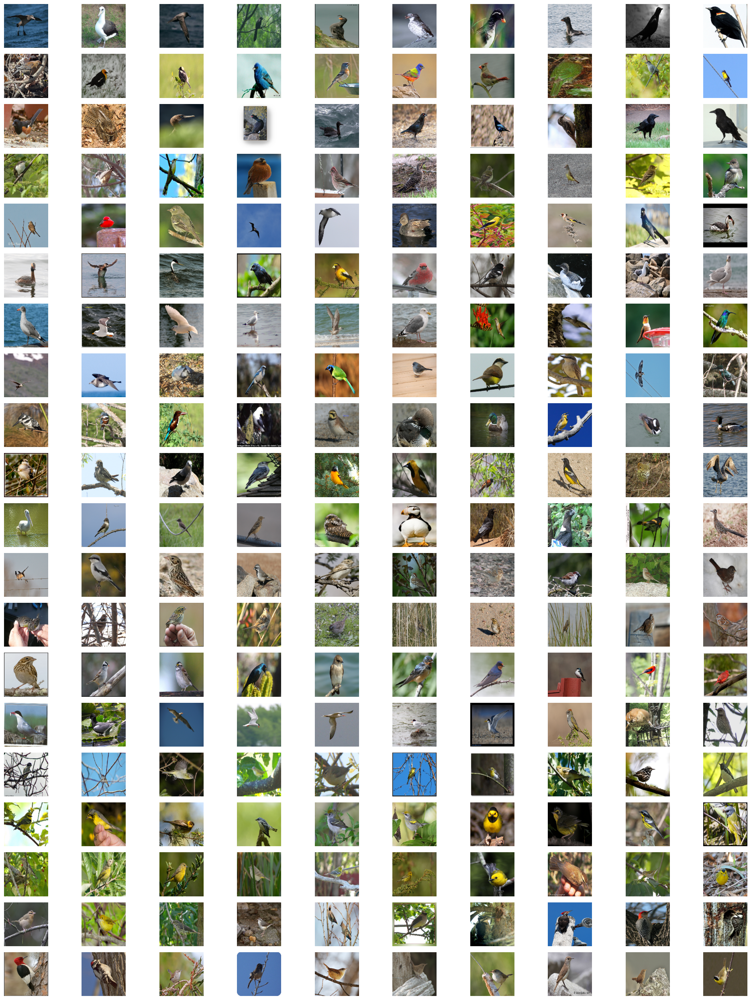

In [5]:

class_names = {v: k for k, v in train_ds.class_indices.items()}
representatives = {class_name: None for class_name in class_names.values()}

for images, labels in train_ds:
    for i in range(images.shape[0]):
        class_index = np.argmax(labels[i])
        class_name = class_names[class_index]
        if representatives[class_name] is None:
            representatives[class_name] = (images[i] * 255).astype("uint8") 
            
    if all(image is not None for image in representatives.values()):
        break

plt.figure(figsize=(20, 25))
for i, (class_name, image) in enumerate(representatives.items()):
    plt.subplot(20, 10, i + 1)
    plt.imshow(image.astype("uint8"))
    plt.axis("off")
plt.tight_layout()
plt.show()

Num GPUs Available:  1


/home/des/suns/env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 19s 138ms/step - accuracy: 0.0043 - loss: 5.4418 - val_accuracy: 0.0088 - val_loss: 5.2876
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - accuracy: 0.0087 - loss: 5.2469 - val_accuracy: 0.0125 - val_loss: 5.1300
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - accuracy: 0.0188 - loss: 5.0858 - val_accuracy: 0.0275 - val_loss: 5.0267
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - accuracy: 0.0393 - loss: 4.8721 - val_accuracy: 0.0300 - val_loss: 4.8721
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - accuracy: 0.1098 - loss: 4.3331 - val_accuracy: 0.0500 - val_loss: 4.8045
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - accuracy: 0.2361 - loss: 3.5324 - val_accuracy: 0.0613 - val_loss: 5.0044
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - accuracy: 0.4030 - loss: 2.6345 - val_accuracy: 0.0587 - val_loss: 5.4821
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 15s 144ms/step - accuracy: 0.5276 - loss: 1

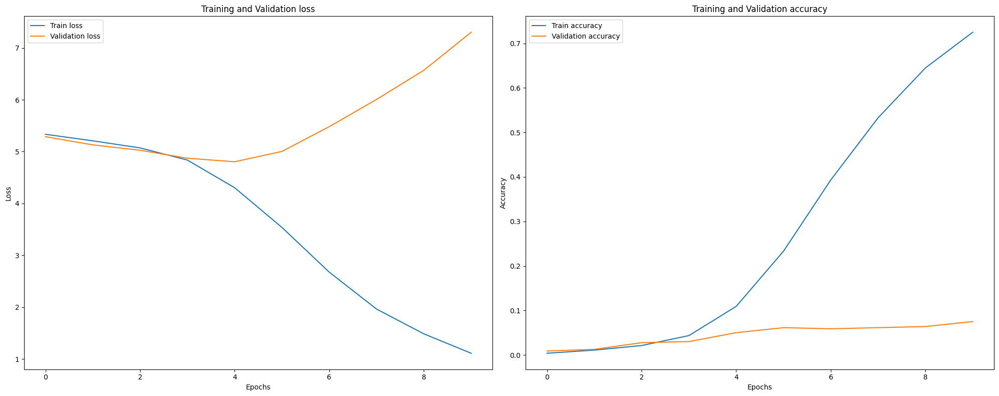

In [9]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
model = keras.Sequential()

model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_size[0], img_size[1], 3)))
model.add(tf.keras.layers.Dropout(0.05))
model.add(layers.MaxPooling2D((2, 2)))


model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Dropout(0.1))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Dropout(0.15))

model.add(layers.Flatten())
#model.add(layers.Dense(64, activation='relu'))
#model.add(tf.keras.layers.Dropout(0.3))

model.add(layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dropout(0.4))

model.add(layers.Dense(200, activation='softmax'))

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
history = model.fit(train_ds, epochs=20, verbose=1, validation_data=validation_ds, callbacks=[early_stopping])

loss, accurracy = model.evaluate(test_ds)
train_loss, train_accurracy = model.evaluate(train_ds)
print(f'Test accuracy: {accurracy:.4f}')
print(f'Training accuracy: {train_accurracy:.4f}')
plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
sns.lineplot(x=range(len(history.history['loss'])), y=history.history['loss'], label="Train loss")
sns.lineplot(x=range(len(history.history['val_loss'])), y=history.history['val_loss'], label="Validation loss")
plt.title("Training and Validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.subplot(1,2,2)
sns.lineplot(x=range(len(history.history['accuracy'])), y=history.history['accuracy'], label="Train accuracy")
sns.lineplot(x=range(len(history.history['val_accuracy'])), y=history.history['val_accuracy'], label="Validation accuracy")
plt.title("Training and Validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

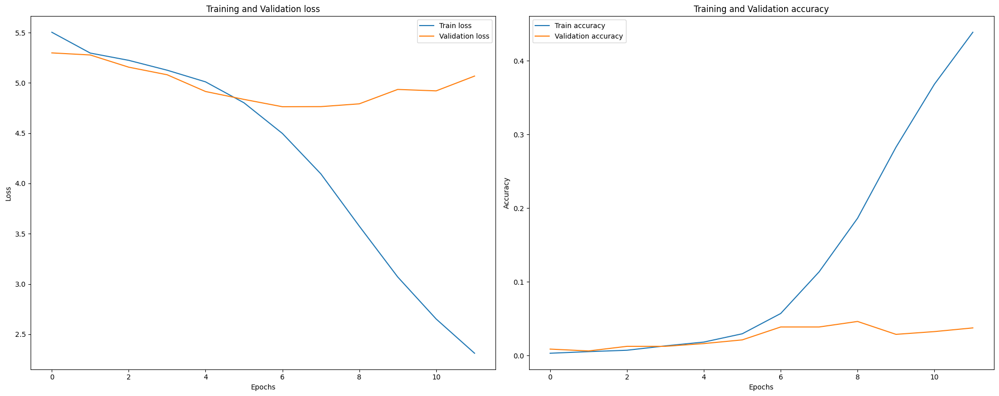

In [7]:
plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
sns.lineplot(x=range(len(history.history['loss'])), y=history.history['loss'], label="Train loss")
sns.lineplot(x=range(len(history.history['val_loss'])), y=history.history['val_loss'], label="Validation loss")
plt.title("Training and Validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.subplot(1,2,2)
sns.lineplot(x=range(len(history.history['accuracy'])), y=history.history['accuracy'], label="Train accuracy")
sns.lineplot(x=range(len(history.history['val_accuracy'])), y=history.history['val_accuracy'], label="Validation accuracy")
plt.title("Training and Validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

In [8]:
y_true, y_pred_classes, class_labels = getPredictionsTrain(model, train_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step


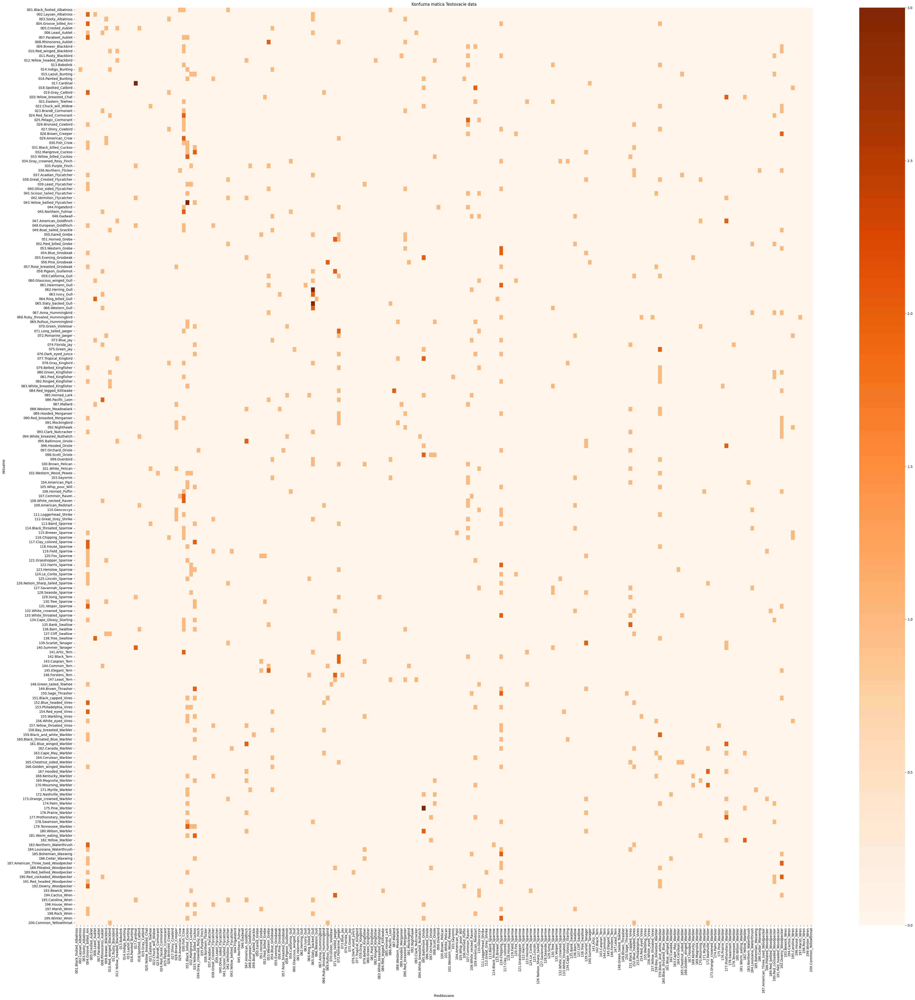

In [9]:
y_pred = np.argmax(model.predict(test_ds), axis=1) 
y_true_test = test_ds.classes
conf_matrix = confusion_matrix(y_true_test, y_pred)

plt.figure(figsize=(50,50))

sns.heatmap(conf_matrix, annot=False, fmt='d', cmap='Oranges', xticklabels=test_ds.class_indices.keys(), yticklabels=test_ds.class_indices.keys())
plt.title("Konfuzna matica Testovacie data")
plt.xlabel("Predikovane")
plt.ylabel("Aktualne")

plt.show()


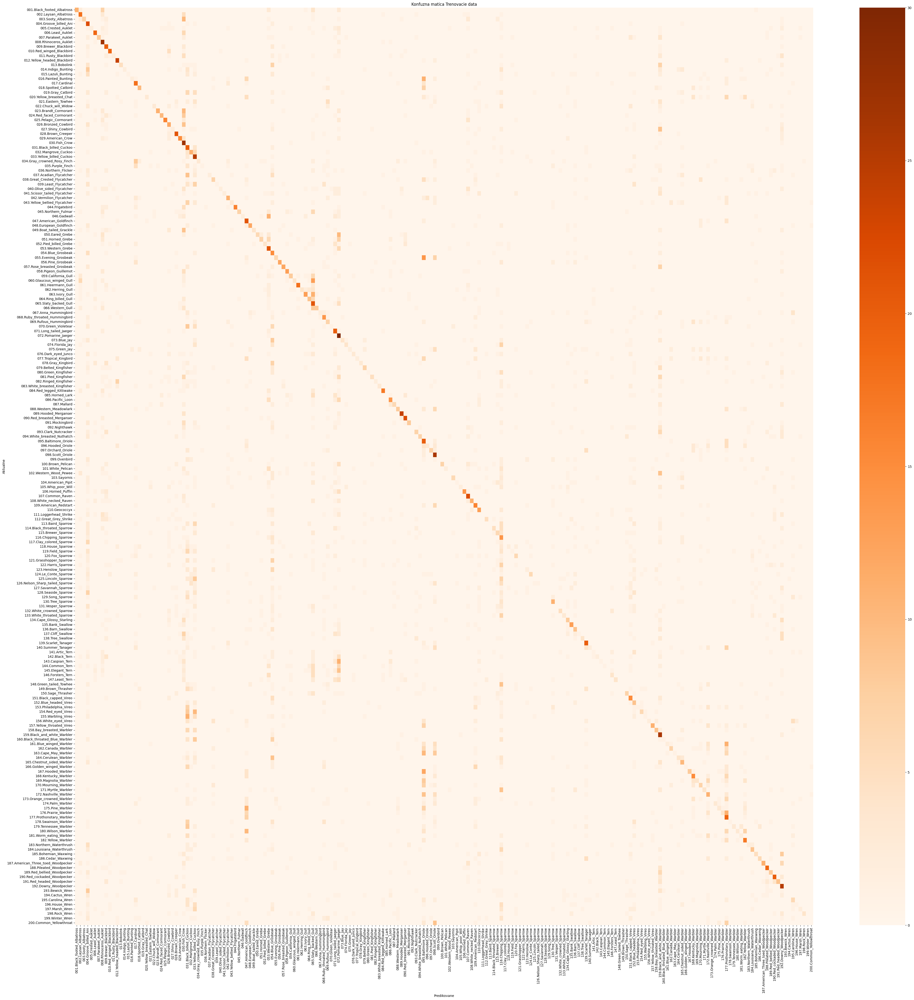

In [10]:
y_true_classes = np.argmax(y_true, axis=1)
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
#plt.subplot(1,2,2)
plt.figure(figsize=(50,50))
sns.heatmap(conf_matrix, annot=False, fmt='d', cmap='Oranges', xticklabels=class_labels, yticklabels=class_labels)
plt.title("Konfuzna matica Trenovacie data")
plt.xlabel("Predikovane")
plt.ylabel("Aktualne")
plt.show()

In [20]:
def extractFeaturesToDf(generator, model, dataset_type):
    features = []  
    image_paths = []  
    labels = [] 
    class_names = {v: k for k, v in generator.class_indices.items()}
    
  
    for _ in range(generator.num_batches):
        images, batch_labels = next(generator)
        batch_features = model.predict(images, verbose=1)
        #batch_features = batch_features.reshape(batch_features.shape[0], -1)  # Flatten the features

        features.extend(batch_features)
        image_paths.extend(generator.filepaths[_ * generator.batch_size : (_ + 1) * generator.batch_size])
        labels.extend(np.argmax(batch_labels, axis=1))

    df = pd.DataFrame(features)
    df['image_path'] = image_paths
    df['label'] = labels
    df['class'] = df['label'].map(class_names)
    df['dataset_type'] = dataset_type
    return df

base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg',  input_shape=(img_size[0], img_size[1], 3))
print("train_df processing")
train_df = extractFeaturesToDf(train_ds, base_model, 'train')
print("validation_df processing")
validation_df = extractFeaturesToDf(validation_ds, base_model, 'validation')
print("test_df processing")
test_df = extractFeaturesToDf(test_ds, base_model, 'test')

birds_df = pd.concat([train_df, validation_df, test_df], axis=0, ignore_index=True)
birds_df.to_csv('birds_df.csv', index=False)


train_df processing
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 318ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6

In [ ]:
birds_features = pd.read_csv('birds_df.csv').iloc[:, :-4].values

pca = PCA(n_components=5)
birds_features_pca = pca.fit_transform(birds_features)

n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=69)
clusters = kmeans.fit_predict(birds_features_pca)

birds_df = pd.read_csv('birds_df.csv')
birds_df['cluster'] = clusters

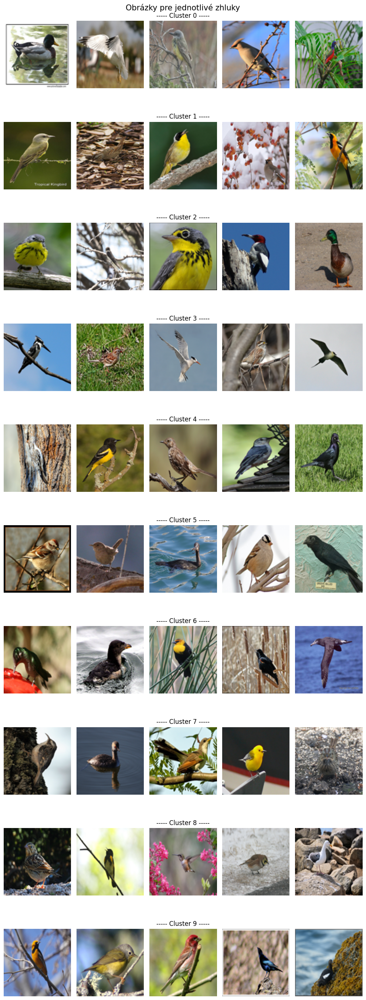

In [22]:
n_images_per_cluster = 5
fig, axes = plt.subplots(n_clusters, n_images_per_cluster, figsize=(10, 28))
fig.suptitle("Obrázky pre jednotlivé zhluky", fontsize=15)

for cluster in range(n_clusters):
    # Náhodný výber obrázkov z aktuálneho zhluku
    cluster_images = birds_df[birds_df['cluster'] == cluster]['image_path'].values
    if len(cluster_images) > n_images_per_cluster:
        cluster_images = np.random.choice(cluster_images, n_images_per_cluster, replace=False)

    for i, img_path in enumerate(cluster_images):
        img = Image.open(img_path).resize((100, 100))
        axes[cluster, i].imshow(img)
        axes[cluster, i].axis('off')

    # Označenie stredu riadku názvom zhluku
    axes[cluster, n_images_per_cluster // 2].set_title(f"----- Cluster {cluster} -----", fontsize=12, loc='center')

plt.tight_layout()
plt.show()

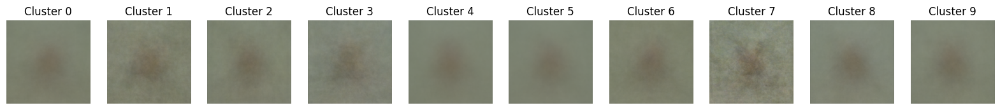

In [24]:
# Funkcia na výpočet priemerného obrázku
def compute_average_image(df, cluster):
    cluster_images = df[df['cluster'] == cluster]['image_path'].values
    imgs = [np.array(Image.open(img_path).resize((224, 224)).convert('RGB')) for img_path in cluster_images]
    avg_img = np.mean(imgs, axis=0).astype(np.uint8)
    return avg_img

# Zobrazenie priemerných obrázkov
fig, axes = plt.subplots(1, n_clusters, figsize=(20, 5))
for cluster in range(n_clusters):
    avg_img = compute_average_image(birds_df, cluster)
    axes[cluster].imshow(avg_img)
    axes[cluster].axis('off')
    axes[cluster].set_title(f'Cluster {cluster}')
plt.show()

In [ ]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(birds_df[(birds_df['dataset_type'] == 'train') | (birds_df['dataset_type'] == 'validation')].iloc[:, :-5].values)
Y_train = birds_df[(birds_df['dataset_type'] == 'train') | (birds_df['dataset_type'] == 'validation')]['label'].values
X_test = scaler.transform(birds_df[birds_df['dataset_type'] == 'test'].iloc[:, :-5].values)
Y_test = birds_df[birds_df['dataset_type'] == 'test']['label'].values
#Classifier
model = RandomForestClassifier()
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

accurracy = accuracy_score(Y_test, y_pred)
accurracy_train = accuracy_score(Y_train, y_pred_train)
print(f"model accuracy: {accurracy}")
print(f"model accuracy train: {accurracy_train}")

model accuracy: 0.04125
model accuracy train: 1.0


In [47]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(birds_df[(birds_df['dataset_type'] == 'train') ].iloc[:, :-5].values)
Y_train = birds_df[(birds_df['dataset_type'] == 'train') ]['label'].values
X_test = scaler.transform(birds_df[birds_df['dataset_type'] == 'test'].iloc[:, :-5].values)
Y_test = birds_df[birds_df['dataset_type'] == 'test']['label'].values
#Classifier
model = SVC(kernel='rbf', C=300)
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

accurracy = accuracy_score(Y_test, y_pred)
accurracy_train = accuracy_score(Y_train, y_pred_train)
print(f"model accuracy: {accurracy}")
print(f"model accuracy train: {accurracy_train}")

model accuracy: 0.0675
model accuracy train: 0.9996875


In [48]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score

# Normalizácia dát
scaler = MinMaxScaler()
X_train = scaler.fit_transform(birds_df[birds_df['dataset_type'] == 'train'].iloc[:, :-5].values)
Y_train = birds_df[birds_df['dataset_type'] == 'train']['label'].values
X_test = scaler.transform(birds_df[birds_df['dataset_type'] == 'test'].iloc[:, :-5].values)
Y_test = birds_df[birds_df['dataset_type'] == 'test']['label'].values

# Grid Search pre optimalizáciu hyperparametrov SVC
param_grid = {
    'C': [1, 10, 100, 300],
    'kernel': ['rbf', 'linear'],
    'gamma': ['scale', 'auto']
}
grid_search = GridSearchCV(SVC(), param_grid, cv=3, scoring='accuracy', verbose=1)
grid_search.fit(X_train, Y_train)

# Najlepšie parametre a model
best_model = grid_search.best_estimator_
print("Best parameters found:", grid_search.best_params_)

# Testovanie na testovacích dátach
y_pred = best_model.predict(X_test)
y_pred_train = best_model.predict(X_train)

accuracy = accuracy_score(Y_test, y_pred)
accuracy_train = accuracy_score(Y_train, y_pred_train)

# Výstup presností
print(f"Model accuracy on test data: {accuracy}")
print(f"Model accuracy on train data: {accuracy_train}")

Fitting 3 folds for each of 16 candidates, totalling 48 fits


/home/des/suns/env/lib/python3.11/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best parameters found: {'C': 300, 'gamma': 'scale', 'kernel': 'rbf'}
Model accuracy on test data: 0.0675
Model accuracy on train data: 0.9996875


In [ ]:
#trenovanie na clusteroch
X_train = birds_df[birds_df['dataset_type'] == 'train'].iloc[:, :-5].values
Y_train = birds_df[birds_df['dataset_type'] == 'train']['cluster'].values
X_test = birds_df[birds_df['dataset_type'] == 'test'].iloc[:, :-5].values
Y_test = birds_df[birds_df['dataset_type'] == 'test']['cluster'].values
#DecisionTreeClassifier
model = DecisionTreeClassifier()
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

accurracy = accuracy_score(Y_test, y_pred)
accurracy_train = accuracy_score(Y_train, y_pred_train)
print(f"model accuracy: {accurracy}")
print(f"model accuracy train: {accurracy_train}")

model accuracy: 0.77875
model accuracy train: 1.0
